# CAD lab : Assignment 2
## Aditya Prabhakar [22CE01001]
#### github:https://github.com/aditya-prabhakar-18/CAD-lab/blob/d9f76c831564f9141c1b62f6dbdeaacc62c3b0f2/Assignment-1-Aditya.ipynb

## Q1 — Rectangular Domain With Given Displacement Field

1. Imports `Plots` for visualization.
2. Defines displacement components  
   - $u_1(X_1,X_2)=0.2\log(1+X_1+X_2)$ 
   - $u_2(X_1,X_2)=0.2e^{X_1}$
3. Creates a uniform grid for $(0.1<X_1,X_2<1)$
4. Defines a function that computes displaced coordinates:  
   \(x = X + u(X)\).
5. Plots **characteristic lines**: constant $(X_1$ and constant$(X_2)$.
6. Maps all these lines under the displacement field.
7. Adds original undeformed boundary as a dashed box.
8. Shows the final deformed mesh.


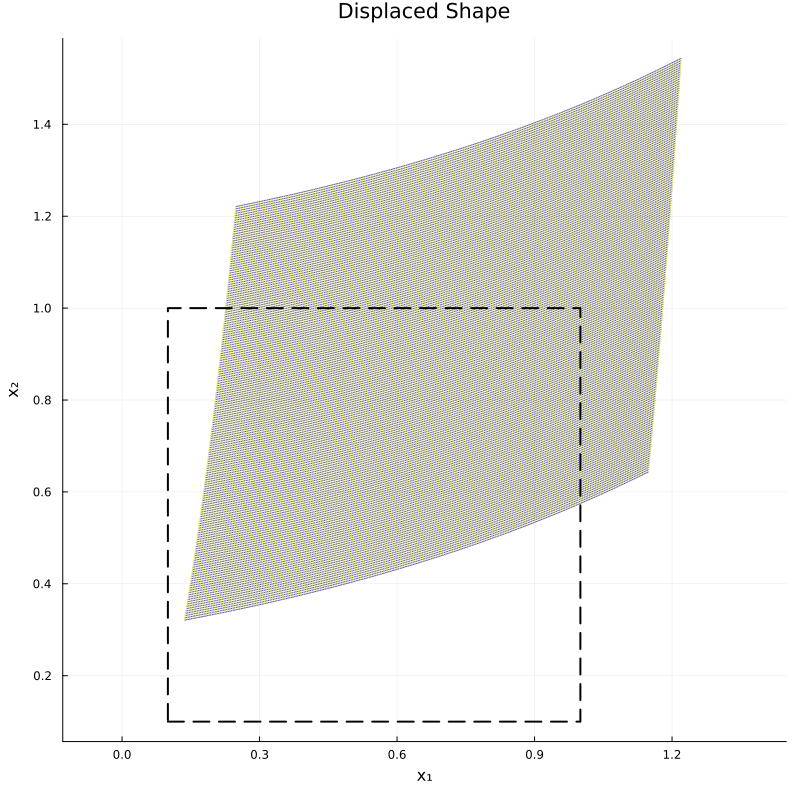

In [6]:
# Question 1

using Plots

u1(X1, X2) = 0.2 * log(1 + X1 + X2)
u2(X1, X2) = 0.2 * exp(X1)

X1_range = 0.1:0.005:1.0
X2_range = 0.1:0.005:1.0

plt = plot(size=(800, 800), aspect_ratio=:equal, legend=false, title="Displaced Shape")

X1_displaced=[X1 + u1(X1, X2) for X1 in X1_range,X2 in X2_range]
X2_displaced=[X2 + u2(X1, X2) for X1 in X1_range,X2 in X2_range]
plot!(plt,X1_displaced, X2_displaced, color=:blue, linewidth=1, alpha=0.7)

X1_displaced=[X1 + u1(X1, X2) for X2 in X2_range,X1 in X1_range]
X2_displaced=[X2 + u2(X1, X2) for X2 in X2_range,X1 in X1_range]
plot!(plt, X1_displaced, X2_displaced, color=:yellow, linewidth=1, alpha=0.7)


# Add the original undeformed shape for reference
original_x = [0.1, 1.0, 1.0, 0.1, 0.1]
original_y = [0.1, 0.1, 1.0, 1.0, 0.1]
plot!(plt, original_x, original_y, color=:black, linewidth=2, linestyle=:dash, label="Original Shape")

xlabel!(plt, "x₁")
ylabel!(plt, "x₂")

display(plt)

## Q2 — Annular Region in Polar Coordinates

1. Uses `Plots` + `LinearAlgebra`.
2. Defines polar displacement:  
   $u_r = 0.4(R-1)^2cos(3\theta)$ 
   $u_\theta = 0.4(R-1)^3$
3. Converts each point $(X_1,X_2) → (R,\theta)$
4. Constructs polar basis vectors $(e_r) and (e_\theta)$
5. Converts polar displacement → Cartesian:  
   $u = u_r e_r + u_\theta e_\theta$
6. Computes displaced coordinates for all grid points.
7. Plots characteristic radial lines and circular arcs for the annulus.
8. Adds original circular boundaries.

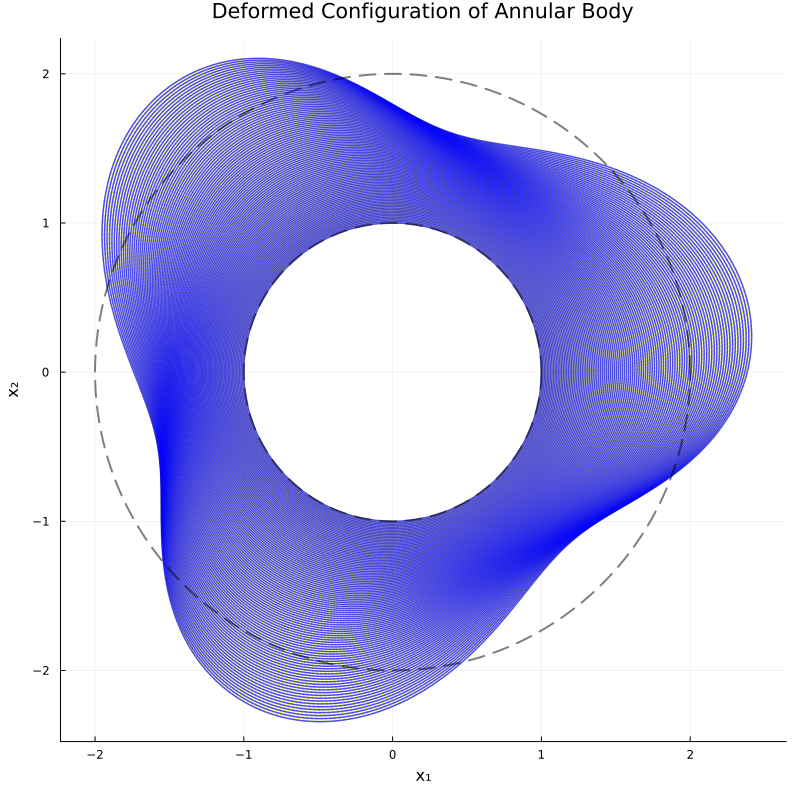

In [30]:
# Question 2

using Plots, LinearAlgebra

u_r(R, θ) = 0.4 * (R - 1)^2 * cos(3θ)
u_θ(R, θ) = 0.4 * (R - 1)^3

polar_to_cartesian(R, θ) = (R * cos(θ), R * sin(θ))

# Cartesian base vectors
e1 = [1, 0]
e2 = [0, 1]

# Function to get polar base vectors
polar_base_vectors(θ) = [cos(θ), sin(θ)],[-sin(θ), cos(θ)]


# Function to compute displaced position
function displaced_position(R, θ)
    # Original position in Cartesian coordinates
    X1, X2 = polar_to_cartesian(R, θ)
    X = [X1, X2]
    
    # Polar base vectors at angle θ
    e_r, e_θ = polar_base_vectors(θ)
    
    # Displacement vector in Cartesian coordinates
    u = u_r(R, θ) * e_r + u_θ(R, θ) * e_θ
    
    # Displaced position
    x = X + u
    return x[1], x[2]
end

# Create grid for the annular body
R_range = 1.0:0.01:2.0 
θ_range = 0:π/256:2π    

# Create the plot
plt = plot(size=(800, 800), aspect_ratio=:equal, legend=false, title="Deformed Configuration of Annular Body",xlabel="x₁", ylabel="x₂")

# Plot constant R circles (deformed)
x_vals = [displaced_position(R, θ)[1] for R in R_range, θ in θ_range]
y_vals = [displaced_position(R, θ)[2] for R in R_range, θ in θ_range]
plot!(plt, x_vals, y_vals, color=:yellow, linewidth=1.5, alpha=0.7)

# Plot constant R circles (deformed)
x_vals = [displaced_position(R, θ)[1] for θ in θ_range, R in R_range]
y_vals = [displaced_position(R, θ)[2] for θ in θ_range, R in R_range]
plot!(plt, x_vals, y_vals, color=:blue, linewidth=1.5, alpha=0.7)




# Plot original undeformed annular body for reference
x_orig = [polar_to_cartesian(1, θ)[1] for θ in θ_range]
y_orig = [polar_to_cartesian(1, θ)[2] for θ in θ_range]
plot!(plt, x_orig, y_orig, color=:black, linewidth=2, linestyle=:dash, alpha=0.5)
x_orig = [polar_to_cartesian(2, θ)[1] for θ in θ_range]
y_orig = [polar_to_cartesian(2, θ)[2] for θ in θ_range]
plot!(plt, x_orig, y_orig, color=:black, linewidth=2, linestyle=:dash, alpha=0.5)


display(plt)

## Q3 — Polar-Defined Displacement Field

1. Imports needed libraries Plots,LinearAlgebra
2. Defines a new field:  
   $u_r = 0.2 e^{X_1}$ 
   $u_\theta = 0.2\log(1+X_1+X_2)$
3. Converts Cartesian points → polar coordinates.
4. Builds polar basis vectors.
5. Converts polar components → Cartesian displacement.
6. Maps every characteristic line through displacement.
7. Plots deformed shape with undeformed shape.

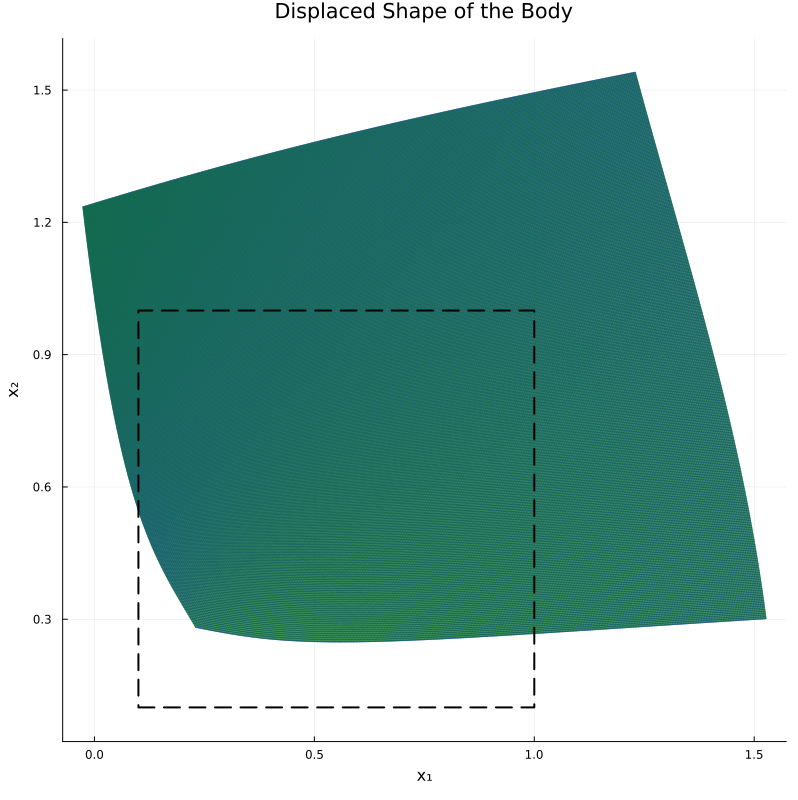

In [31]:
# Question 3

using Plots, LinearAlgebra

# Define the displacement functions
u_r(X1, X2) = 0.2 * exp(X1)
u_θ(X1, X2) = 0.2 * log(1 + X1 + X2)

# Function to compute polar coordinates and base vectors
function polar_components(X1, X2)
    R = sqrt(X1^2 + X2^2)
    θ = atan(X2, X1)
    
    # Polar base vectors
    e_r = [cos(θ), sin(θ)]
    e_θ = [-sin(θ), cos(θ)]
    
    return R, θ, e_r, e_θ
end

# Function to compute displaced position
function displaced_position(X1, X2)
    R, θ, e_r, e_θ = polar_components(X1, X2)
    
    # Original position vector
    X = [X1, X2]
    
    # Displacement vector in Cartesian coordinates
    u = u_r(X1, X2) .* e_r + u_θ(X1, X2) .* e_θ
    
    # Displaced position
    x = X + u
    return x[1], x[2]
end

X1_range = 0.1:0.0025:1.0
X2_range = 0.1:0.0025:1.0

plt = plot(size=(800, 800), aspect_ratio=:equal, legend=false, title="Displaced Shape of the Body",xlabel="x₁", ylabel="x₂")

x_vals = [displaced_position(X1, X2)[1] for X1 in X1_range,X2 in X2_range]
y_vals = [displaced_position(X1, X2)[2] for X1 in X1_range,X2 in X2_range]
plot!(plt, x_vals, y_vals, color=:blue, linewidth=1.5, alpha=0.7)

x_vals = [displaced_position(X1, X2)[1] for X2 in X2_range,X1 in X1_range]
y_vals = [displaced_position(X1, X2)[2] for X2 in X2_range,X1 in X1_range]
plot!(plt, x_vals, y_vals, color=:green, linewidth=1.5, alpha=0.7)

# Plot original undeformed body for reference
original_x = [0.1, 1.0, 1.0, 0.1, 0.1]
original_y = [0.1, 0.1, 1.0, 1.0, 0.1]
plot!(plt, original_x, original_y, color=:black, linewidth=2, linestyle=:dash, label="Original")

display(plt)

# Q4 — Plate With Circular Hole

## (a) Meshing Steps (brief)
- Draw rectangle → subtract circular hole.
- Assign material (E, ν).
- Apply boundary conditions on one side (fixed/symmetry).
- Apply load on opposite side.
- Mesh with **fine elements near the hole** because stress peaks there.
- Solve for displacement & stress.
- Plot von Mises stress and observe concentration around hole.

## (b) Governing PDE
- **Equilibrium:**  
  $\nabla\cdot\sigma + b = 0$
- **Linear elasticity:**  
  $\sigma = C:\varepsilon  $
  $\varepsilon = \frac{1}{2}(\nabla u + \nabla u^T)$
- **Boundary conditions:**  
  - Dirichlet:$ u=\bar{u} $
  - Neumann: $\sigma n = t$

## (c) Gridap–Abaqus Comparison
- Compare:  
  - Max von Mises  
  - Max displacement  
  - Result in Abaqus was generated as follows
  - 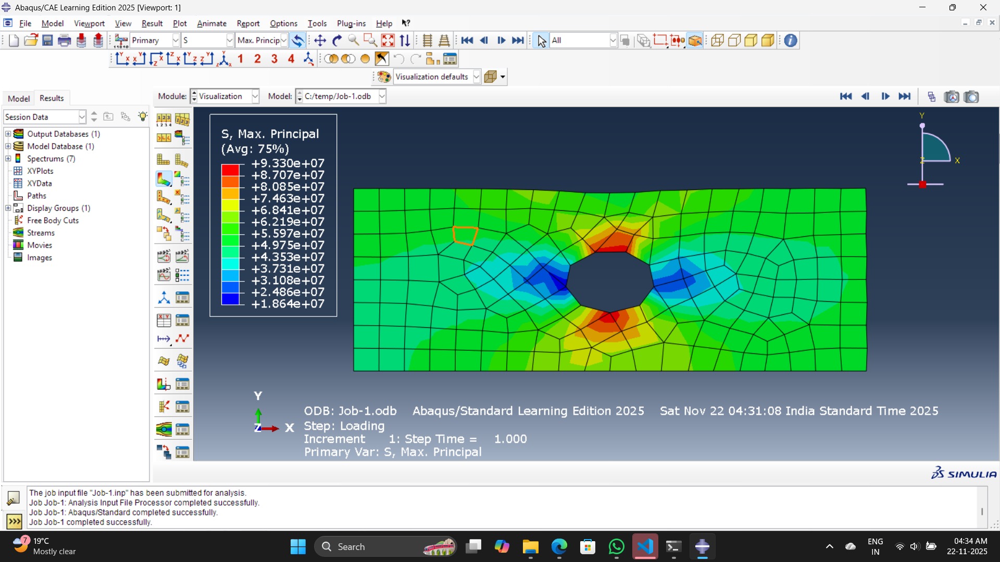


# Q5 — 3D Cantilever With Point Load

## (a) Meshing Steps

- Create 3D block (1000 × 250 × 200 mm).
- Fix one end (encastre).
- Apply **1000 N** at free end (preferably as small patch load dispersed on the free end section → avoids singularity).


---

## (b) Governing PDE

Same as Q4:  
$\nabla\cdot\sigma=0,\;\sigma=C:\varepsilon,\;\varepsilon=\tfrac12(\nabla u+(\nabla u)^T)$
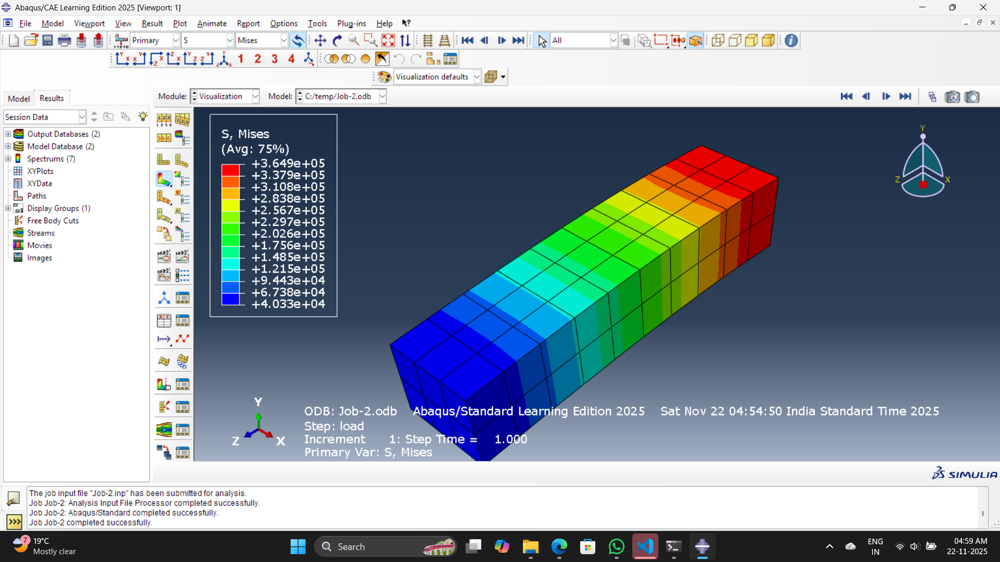

# Q6 — Cantilever With Uniform Load on Top Surface

## (a) Meshing Steps

- Same geometry and fixing as Q5.
- Apply **pressure** on top surface (as given in problem).
- Maintain consistent units.
- Use refined mesh near fixed support.

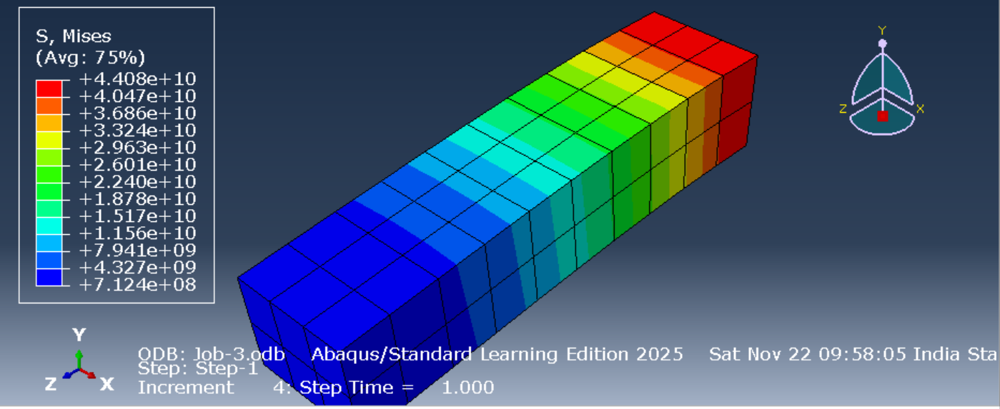